In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import gc

%matplotlib inline

In [25]:
def upload_file(fname):
    pos = pd.read_csv("csv/pos" + fname + ".csv")
    neg = pd.read_csv("csv/neg" + fname + ".csv")
    return pos, neg

In [410]:
fnames = ["VPae", "VPbad", "VPbax", "VPbba", "VPdx", "VPgaa", "VPgab", "VPgac", "VPgae", "VPgag", "VPgah", "VPgal", "VPgam", 
         "VPih", "VPii", "VPja", "VPsaj", "VPsal"]

In [14]:
def draw_signals():
    globMeanPos = np.zeros(300*59)
    globMeanNeg = np.zeros(300*59)
    for fname in fnames:
        pos, neg = upload_file(fname)
        meanPos = np.mean(pos)
        globMeanPos += meanPos
        meanNeg = np.mean(neg)
        globMeanNeg += meanNeg
        cols = list(pos)
        for i in range(59):
            name = cols[i*300].split('.')[0]
            plt.ylim(-20, 80)
            plt.title(fname + ": " + name, fontsize=16, fontweight='bold')
            plt.plot(meanPos[i*300:i*300+300].values, label="Braking Event")
            plt.plot(meanNeg[i*300:i*300+300].values, label="Normal Driving")
            plt.legend()
            plt.show()
    return globMeanPos, globMeanNeg

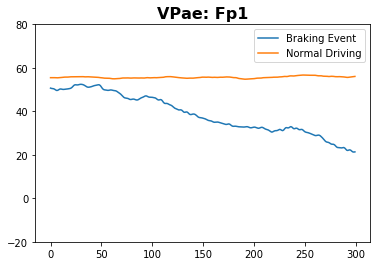

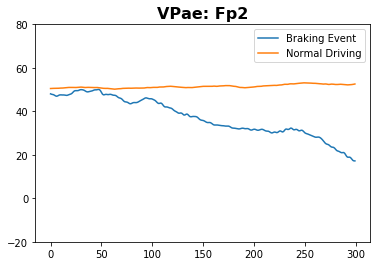

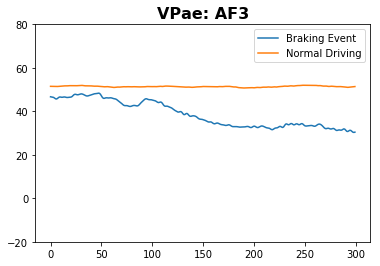

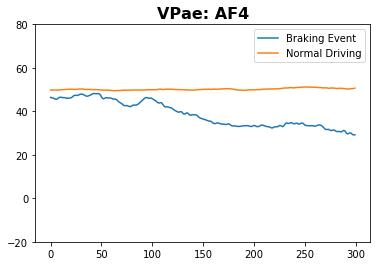

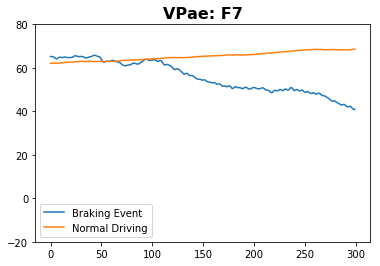

...

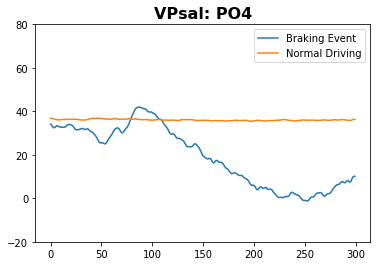

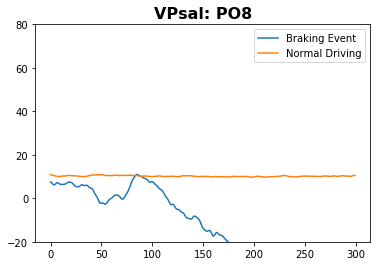

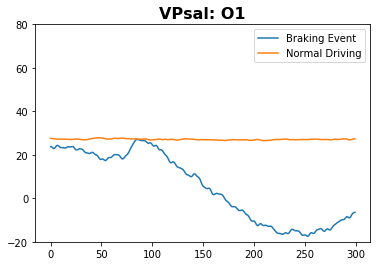

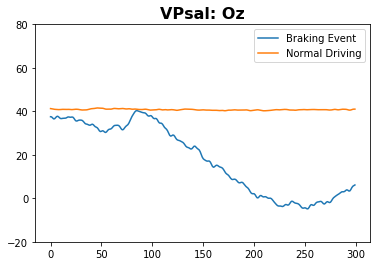

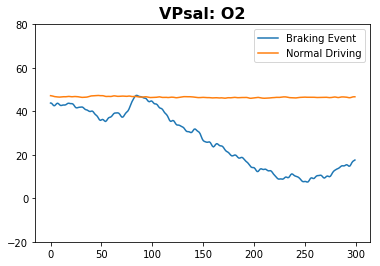

In [15]:
globMeanPos, globMeanNeg = draw_signals()

In [4]:
pos = upload_file("VPae")

In [75]:
cols = list(pos)

In [24]:
globMeanPos /= 18
globMeanNeg /= 18

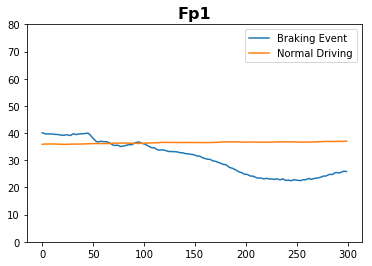

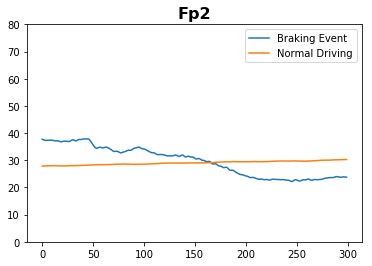

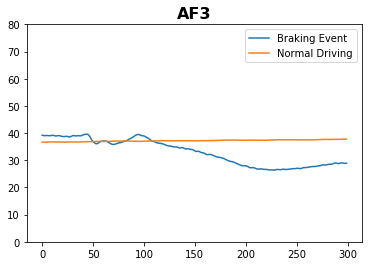

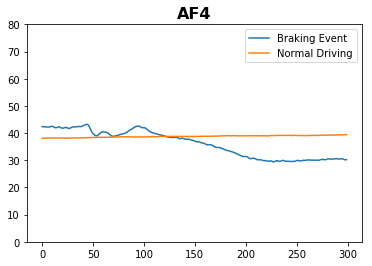

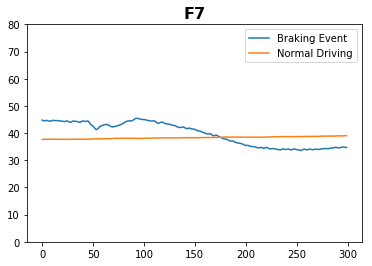

...

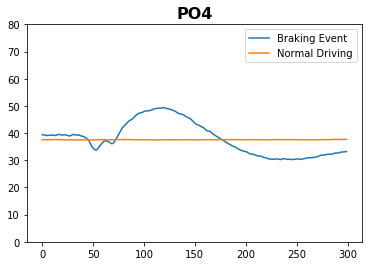

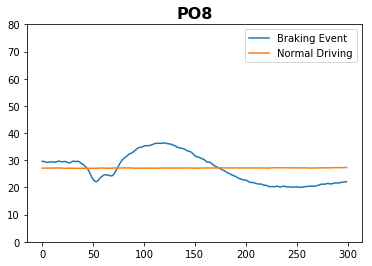

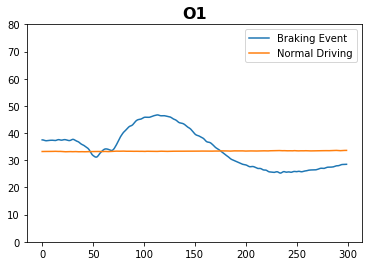

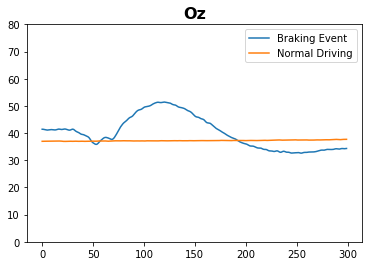

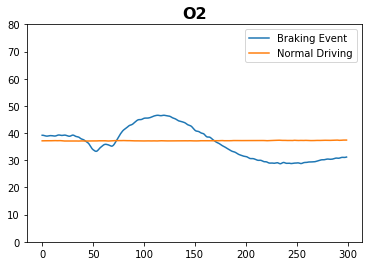

In [26]:
for i in range(59):  
    name = cols[i*300].split('.')[0]
    plt.ylim1(10, 60)
    plt.title(name, fontsize=16, fontweight='bold')
    plt.plot(globMeanPos[i*300:i*300+300], label="Braking Event")
    plt.plot(globMeanNeg[i*300:i*300+300], label="Normal Driving")
    plt.legend()
    plt.show()

In [ ]:
-the stimulaion in paper was the light of the frontal cars
-does the brain behaves different to different stimulus? ex: crossing person, sudden stop, light

In [ ]:
#base line correction

1500  300
100    20
#subtract the mean of the first 20 number from all the numbers

In [74]:
def baseline_correction():
    for fname in fnames:
        pos, neg = upload_file(fname)
        cols = list(pos)
        for i in range(0, 59):
            subValue = np.mean(neg[cols[0+i*300:20+i*300]][0:1].values)
            pos[cols[i*300:300+i*300]] -= subValue
            neg[cols[i*300:300+i*300]] -= subValue
            meanPos = np.mean(pos)
            meanNeg = np.mean(neg)
            name = cols[i*300].split('.')[0]
            plt.ylim(-20, 80)
            plt.title(fname + ": " + name, fontsize=16, fontweight='bold')
            plt.plot(meanPos[i*300:i*300+300].values, label="Braking Event")
            plt.plot(meanNeg[i*300:i*300+300].values, label="Normal Driving")
            plt.legend()
            plt.show()

In [133]:
def make_columns(cols):
    newCols = []
    for i in range(59):
        name = cols[i*300].split('.')[0]
        newCols.append(cols[i*300:i*300+10])
    return np.array(newCols).flatten()

In [134]:
newCols = make_columns(cols)

In [142]:
#mean of ten discriminating time intervals

def time_intervals_features(pos, neg, newCols):
    mean_features_pos = pd.DataFrame(columns = newCols)
    mean_features_neg = pd.DataFrame(columns = newCols)
    cols = list(pos)
    for i in range(0, 59):
        for j in range(0, 10):
            mean_features_pos[newCols[i*10 + j]] = np.mean(pos[cols[i*300+10*j:i*300+10*j+30]], axis = 1).values
            mean_features_neg[newCols[i*10 + j]] = np.mean(neg[cols[i*300+10*j:i*300+10*j+30]], axis = 1).values
    return mean_features_pos, mean_features_neg
    

In [ ]:
pos, neg = upload_file("VPae")

In [143]:
mean_features_pos, mean_features_neg = time_intervals_features(pos, neg, newCols)

In [182]:
mean_features_pos['y'] = 1

In [181]:
mean_features_neg['y'] = 0

In [ ]:
#find correlation
#

In [351]:
from sklearn.model_selection import train_test_split
import lightgbm as lgb
from sklearn.metrics import classification_report
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis 
from sklearn import preprocessing
from sklearn import metrics

In [400]:
all_data = newPos.append(newNeg)

In [401]:
all_data.shape

(5017, 71)

In [402]:
y = all_data['y']

In [403]:
X = all_data.drop(['y'], axis=1)

In [404]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1000)

In [405]:
X_train = preprocessing.scale(X_train)
X_test = preprocessing.scale(X_test)

In [406]:
LDAClassifier = LinearDiscriminantAnalysis()

In [407]:
LDAClassifier.fit(X_train, y_train)

LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
              solver='svd', store_covariance=False, tol=0.0001)

In [408]:
y_predict = predictedResults = LDAClassifier.predict(X_test)

In [412]:
print(classification_report(y_test, y_predict))

             precision    recall  f1-score   support

          0       0.98      0.99      0.98      1436
          1       0.73      0.54      0.62        70

avg / total       0.97      0.97      0.97      1506



In [354]:
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict)
metrics.auc(fpr, tpr)

0.86759848786311178

In [397]:
def reduction(mpos, mneg):
    newPos = mpos
    newNeg = mneg
    for i in range(0, 59):
        name = newCols[i*10].split('.')[0]
        if (not(name == "F3" or name == "F4" or name == "Cz" or name == "C3" or name == "C4" 
                or name == "P3" or name == "P4")):
            newPos = newPos.drop(newPos[newCols[i*10:i*10+10]], axis=1)
            newNeg = newNeg.drop(newNeg[newCols[i*10:i*10+10]], axis=1)
    return newPos, newNeg

In [398]:
newPos, newNeg = reduction(mean_features_pos,  mean_features_neg )

In [416]:
def classify_all():
    LDAClassifier = LinearDiscriminantAnalysis()
    for f in fnames:
        pos, neg = upload_file(f)
        mean_features_pos, mean_features_neg = time_intervals_features(pos, neg, newCols)
        mean_features_pos['y'] = 1
        mean_features_neg['y'] = 0
        all_data = mean_features_pos.append(mean_features_neg)
        y = all_data['y']
        X = all_data.drop(['y'], axis=1)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1000)
        X_train = preprocessing.scale(X_train)
        X_test = preprocessing.scale(X_test)
        LDAClassifier.fit(X_train, y_train)
        y_predict = predictedResults = LDAClassifier.predict(X_test)
        print(f)
        print(classification_report(y_test, y_predict))
        fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict)
        print("AUC: " + str(metrics.auc(fpr, tpr)))

In [417]:
classify_all()

VPae
             precision    recall  f1-score   support

          0       0.99      0.99      0.99      1436
          1       0.83      0.74      0.78        70

avg / total       0.98      0.98      0.98      1506

AUC: 0.867598487863
VPbad
             precision    recall  f1-score   support

          0       0.99      1.00      0.99      1434
          1       0.93      0.84      0.88        80

avg / total       0.99      0.99      0.99      1514

AUC: 0.917006624826
VPbax
             precision    recall  f1-score   support

          0       0.99      1.00      1.00      1427
          1       0.93      0.90      0.91        82

avg / total       0.99      0.99      0.99      1509

AUC: 0.949117199651
VPbba
             precision    recall  f1-score   support

          0       0.99      0.99      0.99      1489
          1       0.79      0.80      0.80        46

avg / total       0.99      0.99      0.99      1535

AUC: 0.898815954682
VPdx
             precision    recall

C:\Users\user\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


VPgae
             precision    recall  f1-score   support

          0       0.98      0.99      0.99      1431
          1       0.77      0.73      0.75        81

avg / total       0.97      0.97      0.97      1512

AUC: 0.857908222688
VPgag
             precision    recall  f1-score   support

          0       0.99      1.00      0.99      1429
          1       0.92      0.82      0.87        74

avg / total       0.99      0.99      0.99      1503

AUC: 0.910412687005
VPgah
             precision    recall  f1-score   support

          0       0.99      0.99      0.99      1456
          1       0.84      0.84      0.84        68

avg / total       0.99      0.99      0.99      1524

AUC: 0.915340174531
VPgal
             precision    recall  f1-score   support

          0       0.98      0.97      0.98      1442
          1       0.53      0.63      0.58        73

avg / total       0.96      0.96      0.96      1515

AUC: 0.800852126993
VPgam
             precision    reca